In [1]:



def pca(w_gt_arr, w_start, w_size):
    '''
    Conduct PCA, but if (n_variants < min_var_per_w) generate empty/dummy output instead
    '''

    # get window mid for X value
    w_mid = int(w_start + w_size/2-1)

    # count variants
    n_var = w_gt_arr.shape[0]

    # if # variants passes specified threshold  
    if n_var >= config.min_var_per_w:
        pca = allel.pca(
            w_gt_arr,
            n_components=2,
            copy=True,
            scaler='patterson',
            ploidy=2,
        )
        #w_pca =  np.stack((pca[0][:, 0], pca[0][:, 1]), axis=1)
        w_pca =  pca[0][:, 0]
        v_exp = [pca[1].explained_variance_ratio_[0]*100, pca[1].explained_variance_ratio_[1]*100]

    # else create empty output
    else:
        print(
            '[INFO] Skipped window ' + str(w_start) + '-' + str(w_start + w_size-1) + ' with ' +
            str(n_var) + ' variants (threshold is ' + str(config.min_var_per_w) +
            ' variants per window)',
            file=sys.stderr, flush=True,
        )
        empty_lst = [None] * w_gt_arr.shape[1]
        #w_pca = np.stack((empty_lst, empty_lst), axis=1)
        w_pca = empty_lst
        v_exp = [None, None]    

    # append output
    w_mid_lst.append(w_mid)
    w_pca_lst.append(w_pca)
    v_exp_lst.append(v_exp)
    n_var_lst.append(n_var)

def windowed_pca(variant_file_path, chrom, start, stop, metadata_df, w_size, w_step, min_maf, pca):
    '''
    Window-by-window analysis
    '''
    
    global w_mid_lst, w_pca_lst, v_exp_lst, n_var_lst

    # initialize results containers
    w_mid_lst = []
    w_pca_lst = []
    v_exp_lst = []
    n_var_lst = []

    # conduct windowed PCA using window_parser() function
    if variant_file_path.endswith('.vcf') or variant_file_path.endswith('.vcf.gz'):
        from modules.window_parser import win_vcf_gt
        win_vcf_gt(
            variant_file_path,
            chrom, start, stop,
            metadata_df['id'],
            w_size, w_step,
            pca,
            skip_monomorphic=True,
            min_maf = min_maf,
        )

    elif variant_file_path.endswith('.tsv') or variant_file_path.endswith('.tsv.gz'):
        from modules.window_parser import win_gt_file
        win_gt_file(
            variant_file_path,
            chrom, start, stop,
            metadata_df['id'],
            w_size, w_step,
            pca,
            skip_monomorphic=True,
            min_maf = min_maf,
        )

    # exit if no variants found
    if len(w_pca_lst) == 0:
        print(
        '\n[ERROR] No variants found, check if region was specifified correctly\n',
        file=sys.stderr, flush=True,
        )
        sys.exit()

    # # compile output dataframe for windowed PCA
    # w_pca_df = pd.DataFrame(
    #     np.transpose(w_pca_lst),
    #     index=list(metadata_df['id']),
    #     columns=w_mid_lst,
    # )
    # w_pca_df.index.names = ['id']

    # # compile output dataframe for supplementary info (% variance explained, # sites per window)
    # w_stats_df = pd.DataFrame(
    #     w_stats_lst,
    #     index=w_mid_lst,
    #     columns=['pct_explained_pc_1', 'pct_explained_pc_2', 'n_variants'],
    # )
    # w_stats_df.index.names = ['window_mid']

    return w_mid_lst, w_pca_lst, v_exp_lst, n_var_lst

In [16]:
##### MANUAL SETUP/ARGUMENTS

variant_file_path = 'test_dataset/input/sample.vcf.gz'
metadata_path = 'test_dataset/input/metadata.tsv'
output_prefix = 'test_dataset/output/pca_test_vcf_gt'
w_size = 1000000
w_step = 10000
min_maf = 0.1
pc = 2
taxon = 'id'
group = 'ind_1,ind_2,ind_3,ind_4,ind_5,ind_6'
color_taxon = 'inversion_state'
guide_samples = 'ind_2'
chrom = 'chr1'
start = 3000000
stop =  5000000
start = 0
stop =  33000000

# handle 'None' input
taxon = None if taxon == 'None' else taxon
group = None if group == 'None' else group

# set PC in config
config.pc = pc

In [17]:
## Main

# def main():
############################ START INDENT 1

# parse command line arguments
# parse_arguments()



# make output directory if output_prefix contains '/'
if '/' in output_prefix:
    if not os.path.exists('/'.join(output_prefix.split('/')[0:-1]) + '/'):
        os.makedirs('/'.join(output_prefix.split('/')[0:-1]) + '/')

# compile text and stats figure output files (pc figure depends on color taxon --> see below)
w_pca_tsv_path =        output_prefix + '.w_pc_' + str(config.pc) + '.tsv'
w_stats_tsv_path =      output_prefix + '.w_stats'         + '.tsv'
w_stats_fig_html_path = output_prefix + '.w_stats'         + '.html'
w_stats_fig_pdf_path =  output_prefix + '.w_stats'         + '.pdf'

# fetch sample ids from variant file
from modules.utils import fetch_variant_file_samples
variant_file_sample_lst = fetch_variant_file_samples(variant_file_path)

# read metadata
from modules.utils import read_metadata
metadata_df = read_metadata(
    metadata_path,
    variant_file_sample_lst,
    taxon=taxon,
    group=group,
)

# if guide sample was specified, check if it is in the input samples
if guide_samples:
    gs = set(guide_samples.split(','))
    missing_gs = list((gs^set(metadata_df['id']))&gs)
    if len(missing_gs) > 0:
        print(
            '\n[ERROR] Specified guide sample(s) ' + ', '.join(missing_gs) + ' are missing ' +
            'from the input samples\n',
            file=sys.stderr, flush=True,
        )
        sys.exit()

# check if IDs are unique
if not len(metadata_df['id']) == len(set(metadata_df['id'])):
    print(
        '\n[ERROR] Duplicate sample IDs (first metadata column)\n',
        file=sys.stderr, flush=True,
    )
    sys.exit()

# if there is output from a previous run, use it
if os.path.exists(w_pca_tsv_path) and os.path.exists(w_stats_tsv_path):
    print(
        '\n[INFO] Plotting data from previous run',
        file=sys.stderr, flush=True,
    )
    w_pca_df = pd.read_csv(
        w_pca_tsv_path,
        sep='\t',
        index_col=[0],
        na_values='NA',
    )
    w_pca_df.columns = [float(x) for x in w_pca_df.columns] # change column name dtype to int
    w_stats_df = pd.read_csv(
        w_stats_tsv_path,
        sep='\t',
        index_col=[0],
        na_values='NA',
    )



In [5]:


#else:
############################ START INDENT 2

print(
    '\n[INFO] Conducting windowed PCA\n',
    file=sys.stderr, flush=True,
)
        
# run windowed PCA
w_mid_lst, w_pca_lst, v_exp_lst, n_var_lst = windowed_pca(
    variant_file_path,
    chrom, start, stop,
    metadata_df,
    w_size, w_step,
    config.min_maf,
    pca,
)

# # polarize windowed PCA output
# from modules.utils import polarize
# w_pca_df = polarize(
#     w_pca_df,
#     mean_threshold=config.mean_threshold,
#     guide_samples=guide_samples,
# )

# # save output data before annotation if not already present
# print(
#     '\n[INFO] Writing output TSVs',
#     file=sys.stderr, flush=True,
# )
# w_pca_df.to_csv(
#     w_pca_tsv_path,
#     sep='\t',
#     na_rep='NA',
#     float_format='%.' + str(config.float_precision) + 'f',
# #####        compression='gzip',
# )
# w_stats_df.to_csv(
#     w_stats_tsv_path,
#     sep='\t',
#     na_rep='NA',
#     float_format='%.' + str(config.float_precision) + 'f',
# #####        compression='gzip',
# )
############################ STOP INDENT 2

# # pivot windowed pca output and annotate with metadata
# from modules.utils import annotate
# w_pca_anno_df = annotate(
#     w_pca_df,
#     metadata_df,
#     'pc_' + str(config.pc),
# )

# # free up memory
# del w_pca_df

# # plot windowed PCA output & save
# print(
#         '\n[INFO] Generating output HTMLs & PDFs',
#         file=sys.stderr, flush=True,
# )
# from modules.utils import plot_per_sample_values
# for c_taxon in color_taxon.split(','): 

#     # compile output paths
#     w_pca_fig_html_path = output_prefix + '.w_pc_' + str(config.pc) + '.' + c_taxon + '.html'
#     w_pca_fig_pdf_path =  output_prefix + '.w_pc_' + str(config.pc) + '.' + c_taxon +  '.pdf'

#     # plot & save
#     w_pca_fig = plot_per_sample_values(
#         w_pca_anno_df,
#         'pc_' + str(config.pc),
#         c_taxon,
#         chrom, start, stop,
#         w_size, w_step,
#     )
#     w_pca_fig.write_html(
#         w_pca_fig_html_path
#     )
#     w_pca_fig.write_image(
#         w_pca_fig_pdf_path,
#         engine='kaleido', scale=2.4,
#     )

# # free up memory
# del w_pca_fig

# # plot window stats & save
# from modules.utils import plot_pca_w_stats
# w_stats_fig = plot_pca_w_stats(
#     w_stats_df,
#     chrom, start, stop,
#     w_size, w_step,
#     config.min_var_per_w,
# )
# w_stats_fig.write_html(
#     w_stats_fig_html_path
# )
# w_stats_fig.write_image(
#     w_stats_fig_pdf_path,
#     engine='kaleido', scale=2.4
# )

print(
    '\n[INFO] Done\n',
    file=sys.stderr, flush=True,
)

############################ STOP INDENT 1
# if __name__ == '__main__':
#     main()


[INFO] Conducting windowed PCA

[INFO] Processed 1 of 3201 windows
[INFO] Processed 2 of 3201 windows
[INFO] Processed 3 of 3201 windows
[INFO] Processed 4 of 3201 windows
[INFO] Processed 5 of 3201 windows
[INFO] Processed 6 of 3201 windows
[INFO] Processed 7 of 3201 windows
[INFO] Processed 8 of 3201 windows
[INFO] Processed 9 of 3201 windows
[INFO] Processed 10 of 3201 windows
[INFO] Processed 11 of 3201 windows
[INFO] Processed 12 of 3201 windows
[INFO] Processed 13 of 3201 windows
[INFO] Processed 14 of 3201 windows
[INFO] Processed 15 of 3201 windows
[INFO] Processed 16 of 3201 windows
[INFO] Processed 17 of 3201 windows
[INFO] Processed 18 of 3201 windows
[INFO] Processed 19 of 3201 windows
[INFO] Processed 20 of 3201 windows
[INFO] Processed 21 of 3201 windows
[INFO] Processed 22 of 3201 windows
[INFO] Processed 23 of 3201 windows
[INFO] Processed 24 of 3201 windows
[INFO] Processed 25 of 3201 windows
[INFO] Processed 26 of 3201 windows
[INFO] Processed 27 of 3201 windows
[INF

In [6]:
# transform to pandas df
x = np.transpose(pd.DataFrame(
    np.transpose(w_pca_lst),
    index=list(metadata_df['id']),
    columns=w_mid_lst,
))

# remove last duplicated window
x = x[:-1]

In [18]:
x

,ind_1,ind_2,ind_3,ind_4,ind_5,ind_6
499999,-4.762551,-3.849531,-0.406797,0.292388,3.919204,4.807635
509999,-4.762551,-3.849531,-0.406797,0.292388,3.919204,4.807635
519999,-4.762551,-3.849531,-0.406797,0.292388,3.919204,4.807635
529999,-4.762551,-3.849531,-0.406797,0.292388,3.919204,4.807635
539999,-4.762551,-3.849531,-0.406797,0.292388,3.919204,4.807635
...,...,...,...,...,...,...
30819999,-1.878871,-2.862593,-2.779862,-2.889861,15.569111,-5.157106
30829999,-1.921408,-2.440132,-3.148619,-2.847991,15.543037,-5.184050
30839999,-1.509326,-2.244015,-3.294432,-2.528331,15.158898,-5.582040
30849999,-1.509326,-2.244015,-3.294432,-2.528331,15.158898,-5.582040


**ADAPTIVE POLARIZER**

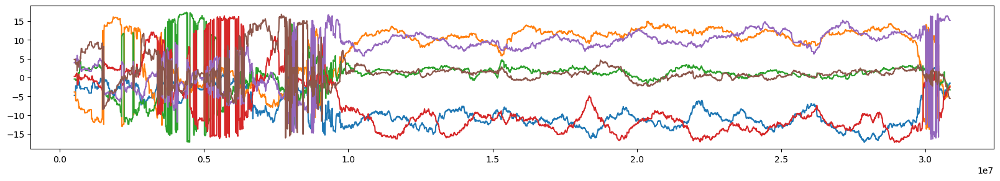

In [11]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,3) 

# raw

fig, ax = plt.subplots()

for i in x.columns:
    ax.plot(x.index, x[i],)

# for i, (idx, row) in enumerate(x.iterrows()):
#     print(str(i) + '  ' + str(idx))
#     print(list(row))

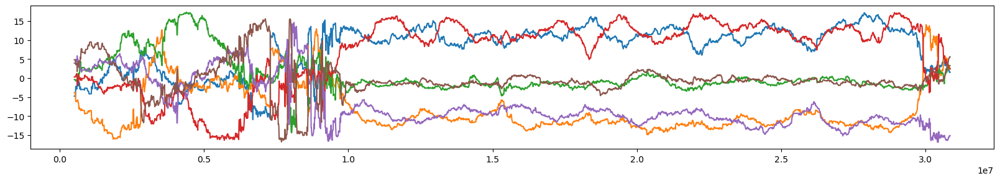

In [12]:
df = x.copy()

prev_polarizer_id = None
prev_row = None

def is_positive(number):
    return 1 if number < 0 else 0

for i, (idx, row) in enumerate(df.iterrows()):

    polarizer_id = row.abs().idxmax()

    if i == 0:
        prev_polarizer_id = polarizer_id
        prev_row = row
        continue

    if polarizer_id == prev_polarizer_id:
        if is_positive(row[polarizer_id]) != is_positive(prev_row[polarizer_id]):
            
            df.loc[idx] = row * -1 
            prev_row = row
    
    if polarizer_id != prev_polarizer_id:
        if is_positive(row[polarizer_id]) != is_positive(prev_row[polarizer_id]):
            

            df.loc[idx] = row * -1 
            prev_row = row

            prev_polarizer_id = polarizer_id

fig, ax = plt.subplots()

for i in df.columns:
    ax.plot(df.index, df[i],)

i==0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
pre
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
regular
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
regular
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   

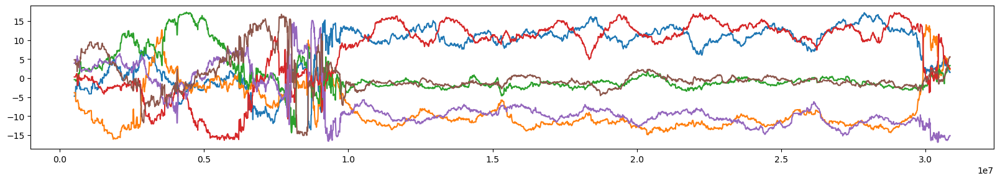

In [26]:
df = x.copy()

def is_positive(x):
    '''
    return 1 if positive (including 0) else return 0
    '''
    return 1 if x > 0 else 0


def auto_polarize(w_pca_df, n_prev_windows):
    '''
    Polarize a dataframe using the signs of the most frequent polarizer (individual with largest 
    absolute value) across n_prev_windows to inform whether to flip the current window.
    '''


    def invert(polarizer_arr):
        '''
        Evaluate an array with an arbitrary number of input windows (rows), columns being the PC values 
        of each sample. The first window is the current window, all others are previous windows that 
        have been polarized. First, determine the polarizer (largest absolute value) of the current 
        window, then the most frequent polarizer across the previous windows. Then record the
        polarization decision of the current window against the included previous windows and output
        the most frequent decision.
        '''

        # get sign for polarizer individual in current window
        polarizer = np.argmax(np.abs(polarizer_arr[0]))
        win_pos = is_positive(polarizer_arr[0][polarizer])

        # # previous windows
        prev_polarizers = [np.argmax(np.abs(polarizer_arr[x])) for x in range(1, len(polarizer_arr))]
        prev_polarizer = max(set(prev_polarizers), key=prev_polarizers.count)
        # initiate polarizations list
        pol_lst = []

        # 
        for i in range(1, len(polarizer_arr)):

            prev_win_pos = is_positive(polarizer_arr[i][polarizer])

            if prev_win_pos == win_pos:
                print(0)
                pol_lst.append(0)
                
            else:
                pol_lst.append(1)
        
        inv = True if sum(pol_lst) > len(pol_lst)/2 else False

        return(inv)

    for i, (idx, row) in enumerate(w_pca_df.iterrows()):

        if i == 0:
            print('i==0')
            # initiate polarizer_arr with first window which will serve as the reference

            polarizer_arr = np.array(
                [
                np.array(w_pca_df.head(1))[0],
                ]
            )

            
            print(polarizer_arr)
            #polarizer_arr = np.vstack([np.array(row), polarizer_arr])
            continue

        if i >= 1 and i <= n_prev_windows:
            print('pre')
            # append rows and polarize with available rows

            # add row
            polarizer_arr = np.vstack([np.array(row), polarizer_arr])
            print(polarizer_arr)

            if invert(polarizer_arr):
                polarizer_arr[0] = polarizer_arr[0] * -1
                w_pca_df.loc[idx] = row * -1
            
            print(polarizer_arr)


        else:
            # append and drop a row with each iteration
            print('regular')

            # add row, drop last row
            polarizer_arr = np.vstack([np.array(row), polarizer_arr])[:-1]
            print(polarizer_arr)

            if invert(polarizer_arr):
                polarizer_arr[0] = polarizer_arr[0] * -1
                w_pca_df.loc[idx] = row * -1

            print(polarizer_arr)
    
    # if i == 100:
    #     break

    return(w_pca_df)


df = auto_polarize(df, 1)


fig, ax = plt.subplots()

for i in df.columns:
    ax.plot(df.index, df[i],)


i==0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
pre
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
pre
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
0
0
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]]
pre
[[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
 [-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353

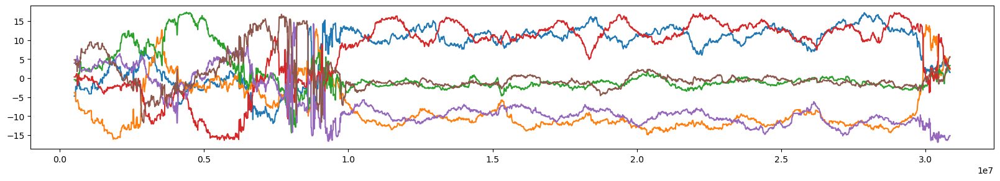

In [31]:
df = x.copy()

def is_positive(x):
    '''
    return 1 if positive (including 0) else return 0
    '''
    return 1 if x > 0 else 0


def auto_polarize(w_pca_df, n_prev_windows):
    '''
    Polarize a dataframe using the signs of the most frequent polarizer (individual with largest 
    absolute value) across n_prev_windows to inform whether to flip the current window.
    '''


    def invert(polarizer_arr):
        '''
        Evaluate an array with an arbitrary number of input windows (rows), columns being the PC values 
        of each sample. The first window is the current window, all others are previous windows that 
        have been polarized. First, determine the polarizer (largest absolute value) of the current 
        window, then the most frequent polarizer across the previous windows. Then record the
        polarization decision of the current window against the included previous windows and output
        the most frequent decision.
        '''

        # get sign for polarizer individual in current window
        polarizer = np.argmax(np.abs(polarizer_arr[0]))
        

        # previous windows
        prev_polarizers = [np.argmax(np.abs(polarizer_arr[x])) for x in range(1, len(polarizer_arr))]
        prev_polarizer = max(set(prev_polarizers), key=prev_polarizers.count)

        # initiate polarizations list
        pol_lst = []

        if polarizer == prev_polarizer:

            win_pos = is_positive(polarizer_arr[0][polarizer])
        
            for i in range(1, len(polarizer_arr)):

                prev_win_pos = is_positive(polarizer_arr[i][polarizer])

                if prev_win_pos == win_pos:
                    print(0)
                    pol_lst.append(0)
                    
                else:
                    pol_lst.append(1)

        if polarizer != prev_polarizer:

            win_pos = is_positive(polarizer_arr[0][prev_polarizer])
        
            for i in range(1, len(polarizer_arr)):

                prev_win_pos = is_positive(polarizer_arr[i][prev_polarizer])

                if prev_win_pos == win_pos:
                    print(0)
                    pol_lst.append(0)
                    
                else:
                    pol_lst.append(1)
        
        inv = True if sum(pol_lst) > len(pol_lst)/2 else False

        return(inv)

    for i, (idx, row) in enumerate(w_pca_df.iterrows()):

        if i == 0:
            print('i==0')
            # initiate polarizer_arr with first window which will serve as the reference

            polarizer_arr = np.array(
                [
                np.array(w_pca_df.head(1))[0],
                ]
            )

            
            print(polarizer_arr)
            #polarizer_arr = np.vstack([np.array(row), polarizer_arr])
            continue

        if i >= 1 and i <= n_prev_windows:
            print('pre')
            # append rows and polarize with available rows

            # add row
            polarizer_arr = np.vstack([np.array(row), polarizer_arr])
            print(polarizer_arr)

            if invert(polarizer_arr):
                polarizer_arr[0] = polarizer_arr[0] * -1
                w_pca_df.loc[idx] = row * -1
            
            print(polarizer_arr)


        else:
            # append and drop a row with each iteration
            print('regular')

            # add row, drop last row
            polarizer_arr = np.vstack([np.array(row), polarizer_arr])[:-1]
            print(polarizer_arr)

            if invert(polarizer_arr):
                polarizer_arr[0] = polarizer_arr[0] * -1
                w_pca_df.loc[idx] = row * -1

            print(polarizer_arr)
    
    # if i == 100:
    #     break

    return(w_pca_df)


df = auto_polarize(df, 23)


fig, ax = plt.subplots()

for i in df.columns:
    ax.plot(df.index, df[i],)


**MINIMIZE SUM OF LEAST SQUARES**

In [4]:
# minimize sum of absolute differences
a = x.copy()

a = a[:-1] # remove last duplicated window

sum_ = sum(a.diff().abs().sum())

for i in a.index:
    b = a.copy()
    b.loc[i] = b.loc[i] * -1

    sum_b = sum(b.diff().abs().sum())

    if sum_b < sum_:
        a = b.copy()
        sum_ = sum_b
    else:
        continue

fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i],)


NameError: name 'x' is not defined

In [14]:
# minimize sum of absolute differences (100 iterations)

a = x.copy()

a = a[:-1] # remove last duplicated window

sum_ = sum(a.diff().abs().sum())

for i in range(0, 100):

    for i in a.index:
        b = a.copy()
        b.loc[i] = b.loc[i] * -1

        sum_b = sum(b.diff().abs().sum())

        if sum_b < sum_:
            a = b.copy()
            sum_ = sum_b
        else:
            continue

fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i],)

KeyboardInterrupt: 

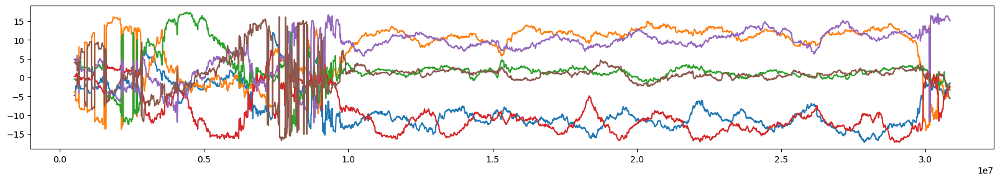

In [15]:
# minimize sum of squares
a = df.copy()

#a = a# pd.DataFrame(np.random.randint(-100, 101, size=(1000, 10)), columns=[f'ind{i}' for i in range(1, 11)])

# Function to polarize rows based on minimizing the sum of squares
def polarize_rows_by_squares(a):
    mean_row = a.mean(axis=0)  # Compute mean across all rows (the consensus direction)
    
    # Iterate through each row and decide if it should be flipped
    for i in range(len(a)):
        row = a.iloc[i]
        sum_squares_original = np.sum((row - mean_row) ** 2)
        sum_squares_flipped = np.sum((-row - mean_row) ** 2)
        
        # Flip the row if flipping reduces the sum of squares
        if sum_squares_flipped < sum_squares_original:
            a.iloc[i] = -row
    
    return a

# Polarize the dataframe
#for i in range(0, 100):
a = polarize_rows_by_squares(a)

fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i],)

In [ ]:
# minimize sum of squares (100 iterations, top 10% of windows)

a = x.copy()

# Function to polarize rows based on minimizing sum of squares for the top 10% of individuals with the largest absolute values
def polarize_rows_by_squares_limited(df, percentage=0.1):
    mean_row = a.mean(axis=0)  # Compute mean across all rows (the consensus direction)
    n_individuals = a.shape[1]
    n_top_individuals = max(1, int(n_individuals * percentage))  # Calculate 10% of the individuals (at least 1)

    for i in range(len(a)):
        row = a.iloc[i]
        
        # Find the indices of the top 10% of individuals with the largest absolute values in the current row
        top_individuals = row.abs().nlargest(n_top_individuals).index
        
        # Compute the sum of squares only for the top individuals
        sum_squares_original = np.sum((row[top_individuals] - mean_row[top_individuals]) ** 2)
        sum_squares_flipped = np.sum((-row[top_individuals] - mean_row[top_individuals]) ** 2)
        
        # Flip the row if flipping reduces the sum of squares for the top individuals
        if sum_squares_flipped < sum_squares_original:
            a.iloc[i] = -row

    return a

# Polarize the dataframe based on the top 10% of individuals with largest absolute values
for i in range(0, 100):
    a = polarize_rows_by_squares_limited(a)

fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i],)

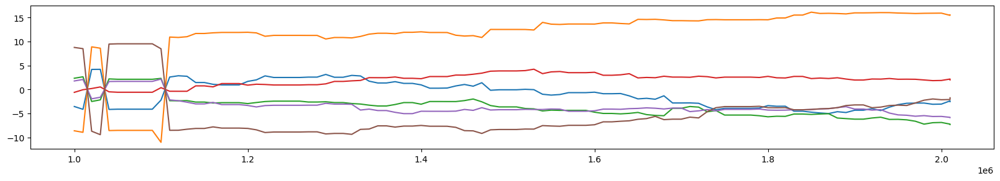

In [629]:
a = x.copy()

# Function to polarize rows by sliding and switching based on the individual with the highest absolute value
def sliding_polarize(a):
    current_individual = a.iloc[0].abs().idxmax()  # Start with the individual having the highest abs value in the first window
    
    for i in range(1, len(a)):
        row = a.iloc[i]
        
        # Check the individual with the highest absolute value in the current window
        next_individual = row.abs().idxmax()
        
        # Polarize the current row by the individual from the previous window
        if row[current_individual] < 0:
            a.iloc[i] = -row
        
        # If a new individual has a higher absolute value, prepare to switch starting from the next window
        if next_individual != current_individual:
            current_individual = next_individual  # Switch for the next next window
    
    return a

# Polarize the dataframe
a = sliding_polarize(a)

fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i],)

In [ ]:

df = x.copy() 

# Function to polarize each row based on the individual with the highest absolute value across the last two windows
def polarize_last_two_windows(df):
    current_individual = df.iloc[0].abs().idxmax()  # Start with the individual having the highest abs value in the first window
    
    # Polarize the first row based on the first window itself
    if df.iloc[0][current_individual] < 0:
        df.iloc[0] = -df.iloc[0]
    
    # Iterate through each window starting from the second
    for i in range(1, len(df)):
        # Look at both current and previous window to determine the individual with the highest absolute value
        if i == 1:
            # If it's the second window, only use the first and second windows
            previous_row = df.iloc[0]
        else:
            previous_row = df.iloc[i-1]
        
        current_row = df.iloc[i]
        combined_abs_values = pd.concat([previous_row.abs(), current_row.abs()], axis=1).max(axis=1)
        
        # Find the individual with the highest absolute value across both windows
        new_individual = combined_abs_values.idxmax()

        # Polarize current window using that individual
        if current_row[new_individual] < 0:
            df.iloc[i] = -current_row
        
    return df

# Polarize the dataframe
df_polarized = polarize_last_two_windows(df)

fig, ax = plt.subplots()

for i in df_polarized.columns:
    ax.plot(df_polarized.index, df_polarized[i],)

In [ ]:
df = x.copy() 

# Function to polarize each row based on the individual with the highest absolute value across the last 5 windows
def polarize_last_five_windows(df):
    for i in range(len(df)):
        # Identify the last 5 windows (or fewer if at the start)
        start_idx = max(0, i - 4)  # Ensure we don't go out of bounds
        window_subset = df.iloc[start_idx:i+1]
        
        # Find the individual with the highest absolute value across these windows
        max_abs_values = window_subset.abs().max(axis=0)
        individual_to_polarize = max_abs_values.idxmax()
        
        # Polarize current window by this individual
        current_row = df.iloc[i]
        if current_row[individual_to_polarize] < 0:
            df.iloc[i] = -current_row

    return df

# Polarize the dataframe
df_polarized = polarize_last_five_windows(df)

fig, ax = plt.subplots()

for i in df_polarized.columns:
    ax.plot(df_polarized.index, df_polarized[i],)

In [ ]:
df = x.copy()

# Function to polarize rows based on the individual with the highest absolute value across the last 5 windows
def polarize_last_five_windows_with_delay(df):
    current_individual = df.iloc[0].abs().idxmax()  # Start with the individual with the highest abs value in the first window
    
    for i in range(len(df)):
        # Identify the last 5 windows (or fewer if at the start)
        start_idx = max(0, i - 4)  # Ensure we don't go out of bounds
        window_subset = df.iloc[start_idx:i+1]
        
        # Find the individual with the highest absolute value across these windows
        max_abs_values = window_subset.abs().max(axis=0)
        new_individual = max_abs_values.idxmax()
        
        # Use the current individual for polarization of the current row
        current_row = df.iloc[i]
        if current_row[current_individual] < 0:
            df.iloc[i] = -current_row
        
        # If a new individual has a higher absolute value, switch starting from the next window
        if new_individual != current_individual:
            current_individual = new_individual  # Switch for the next window
    
    return df

# Polarize the dataframe
df_polarized = polarize_last_five_windows_with_delay(df)

fig, ax = plt.subplots()

for i in df_polarized.columns:
    ax.plot(df_polarized.index, df_polarized[i],)

In [ ]:
df = x.copy()

# Function to polarize rows based on the highest absolute value individual and switching logic
def polarize_with_sign_from_previous(df):
    # Initialize with the first window
    previous_individual = df.iloc[0].abs().idxmax()
    
    # Polarize the first row
    if df.iloc[0][previous_individual] < 0:
        df.iloc[0] = -df.iloc[0]
    
    switches = []  # To keep track of switch points
    
    for i in range(1, len(df)):
        current_row = df.iloc[i]
        
        # Determine the individual with the highest absolute value in the current window
        current_individual = current_row.abs().idxmax()
        
        if current_individual == previous_individual:
            # Continue using the previous individual to polarize
            if current_row[previous_individual] < 0:
                df.iloc[i] = -current_row
        else:
            # Polarize current window using the new individual's sign from the previous window
            if df.iloc[i-1][current_individual] < 0:
                df.iloc[i] = -current_row
            
            # Record the switch using the index
            switches.append(df.index[i])
            
            # Switch to the new individual
            previous_individual = current_individual
    
    return df, switches

# Polarize the dataframe and get the switch points
df_polarized, switch_points = polarize_with_sign_from_previous(df)

# Plotting function
def plot_polarized_data(df, switch_points):
    plt.figure(figsize=(300, 50))
    
    # Plot the data
    plt.plot(df.index, df, label='Polarized Data')
    
    # Annotate switches
    for switch in switch_points:
        plt.axvline(x=switch, color='red', lw=.5, linestyle='-', label='Switch Point' if switch == switch_points[0] else "")
        #plt.text(switch, df.iloc[df.index.get_loc(switch)].max(), 'Switch', color='red', verticalalignment='bottom', horizontalalignment='right')
    
    plt.xlabel('Window')
    plt.ylabel('Value')
    plt.title('Polarized Data with Switch Points')

    plt.axhline(y=0, color='red', lw=3, linestyle='-')
    plt.axhline(y=5, color='grey', lw=1, linestyle='-')
    plt.axhline(y=10, color='grey', lw=1, linestyle='-')
    plt.axhline(y=15, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-5, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-10, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-15, color='grey', lw=1, linestyle='-')


# Plot the polarized data with annotated switch points
plot_polarized_data(df_polarized, switch_points)

In [ ]:
df = x.copy()

# Function to polarize rows based on the highest absolute value individual and switching logic
def polarize_with_correct_sign(df):
    # Initialize
    previous_individual = df.iloc[0].abs().idxmax()
    sign_map = {previous_individual: np.sign(df.iloc[0][previous_individual])}
    
    # Polarize the first row
    if df.iloc[0][previous_individual] < 0:
        df.iloc[0] = -df.iloc[0]
    
    for i in range(1, len(df)):
        current_row = df.iloc[i]
        
        # Determine the individual with the highest absolute value in the current window
        current_individual = current_row.abs().idxmax()
        
        if current_individual == previous_individual:
            # Continue using the previous individual's sign to polarize
            if sign_map[previous_individual] < 0:
                df.iloc[i] = -current_row
        else:
            # Polarize the current window using the sign of the new individual from the last window where this individual was used
            if current_individual in sign_map:
                if sign_map[current_individual] < 0:
                    df.iloc[i] = -current_row
            else:
                # This is the first time this individual is used
                if df.iloc[i-1][current_individual] < 0:
                    df.iloc[i] = -current_row
            
            # Update the sign map for the new individual
            sign_map[current_individual] = np.sign(df.iloc[i][current_individual])
            
            # Update the previous individual
            previous_individual = current_individual
    
    return df, sign_map

# Polarize the dataframe and get the sign map
df_polarized, sign_map = polarize_with_correct_sign(df)


# Plotting function
def plot_polarized_data(df, switch_points):
    plt.figure(figsize=(300, 50))
    
    # Plot the data
    plt.plot(df.index, df, label='Polarized Data')
    
    # Annotate switches
    for switch in switch_points:
        plt.axvline(x=switch, color='red', lw=.5, linestyle='-', label='Switch Point' if switch == switch_points[0] else "")
        #plt.text(switch, df.iloc[df.index.get_loc(switch)].max(), 'Switch', color='red', verticalalignment='bottom', horizontalalignment='right')
    
    plt.xlabel('Window')
    plt.ylabel('Value')
    plt.title('Polarized Data with Switch Points')

    plt.axhline(y=0, color='red', lw=3, linestyle='-')
    plt.axhline(y=5, color='grey', lw=1, linestyle='-')
    plt.axhline(y=10, color='grey', lw=1, linestyle='-')
    plt.axhline(y=15, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-5, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-10, color='grey', lw=1, linestyle='-')
    plt.axhline(y=-15, color='grey', lw=1, linestyle='-')


# Plot the polarized data with annotated switch points
plot_polarized_data(df_polarized, switch_points)

0
[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
1
[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
2
[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
3
[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
4
[-4.762551   -3.849531   -0.40679663  0.29238805  3.9192042   4.8076353 ]
5
[-2.19678    -6.1577635  -0.77828985  0.65378344  4.9197354   3.5595648 ]
6
[-2.19678    -6.1577635  -0.77828985  0.65378344  4.9197354   3.5595648 ]
7
[-2.2885084  -6.24003    -0.7267461   0.96426725  4.757168    3.5341098 ]
8
[-2.876519   -6.0438566  -0.49312347  1.1584358   4.3382883   3.9170203 ]
9
[-2.876519   -6.0438566  -0.49312347  1.1584358   4.3382883   3.9170203 ]
10
[-0.45545432 -5.929957   -0.6283288  -0.5862063   5.86251     1.7374653 ]
11
[-0.95894027 -5.777739   -0.28633255 -1.9440982   5.032199    3.9349258 ]
12
[-0.95894027 -5.777739   -0.28633255 -1.9440982   5.032199    3.9349258 ]
13
[-0.82

0
[-3.5701318 -8.634355   2.322396  -0.619403   1.7536515  8.748333 ]
1
[-4.154485   -8.952529    2.625206   -0.07262491  2.0656686   8.489022  ]
2
[-4.1630406 -8.869593   2.5231545 -0.1778292  1.9673285  8.720349 ]
3
[-4.17956   -8.58581    2.1843743 -0.5084531  1.6435024  9.44646  ]
4
[-4.17956   -8.58581    2.1843743 -0.5084531  1.6435024  9.44646  ]
5
[-4.1307316  -8.548414    2.1073775  -0.59835595  1.6657763   9.504875  ]
6
[-4.1307316  -8.548414    2.1073775  -0.59835595  1.6657763   9.504875  ]
7
[-4.1307316  -8.548414    2.1073775  -0.59835595  1.6657763   9.504875  ]
8
[-4.1307316  -8.548414    2.1073775  -0.59835595  1.6657763   9.504875  ]
9
[-4.1307316  -8.548414    2.1073775  -0.59835595  1.6657763   9.504875  ]
10
[ -2.2321317  -11.041245     2.2986593    0.35822287   2.1485438
   8.467527  ]
11
[ -2.5718102  -10.909427     2.3632557    0.39050213   2.1951678
   8.531873  ]
12
[ -2.8418303  -10.829002     2.3872736    0.39722756   2.3605993
   8.525296  ]
13
[ -2.7312856

In [ ]:
polarizer_arr[2]

In [ ]:
polarizer_arr


In [ ]:
def is_positive(x):
    return 1 if x >= 0 else 0
is_positive(0)

In [ ]:
for i in range(1, len(polarizer_arr)):
    print(i)

In [ ]:
polarizer_arr[1]

In [ ]:
polarizer_arr

In [ ]:
polarizer_arr

In [ ]:
arr_1 = np.array([[1, 1, 1], [2, 2, 2]])
arr_1

In [ ]:
arr_2 = np.array([3, 3, 3])
arr_2

In [ ]:
np.vstack([arr_2, arr_1])

In [ ]:
np.vstack([arr_2, arr_1])[:-1]

In [ ]:
np.array(row)
polarizer_arr = np.vstack(np.array([row]), polarizer_arr)


In [443]:
# Create a 2D array
arr = np.array([[4, 5, 6], 
                [7, 8, 9]])

# New first row
new_first_row = np.array([1, 2, 3])

# Add new first row and remove the last row
arr = np.vstack([new_first_row, arr])[:-1]

In [ ]:
arr

In [ ]:
new_first_row

In [ ]:
arr

**PROCRUSTES**

In [117]:
from scipy.spatial import procrustes
import matplotlib.pyplot as plt

In [ ]:
# plot "raw"
plt.rcParams["figure.figsize"] = (20,3) 

a = np.transpose(pd.DataFrame(
    np.transpose([w_pca[:, 0] for w_pca in w_pca_lst]),
    index=list(metadata_df['id']),
    columns=w_mid_lst,
))
fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i])

In [ ]:
# use GPA to calculate mean shape, then align all pcas to it and determine whether they are reflected, and if so, apply to the data
import numpy as np
from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

def generalized_procrustes_analysis(data_list, iterations=10):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Aligned datasets.
    """
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return mean_shape

def compute_reflections(reference_pca, pcas):
    """
    Compute the reflection matrices for each PCA dataset relative to the mean shape.
    
    Parameters:
        reference_pca (np.ndarray): The mean shape PCA dataset.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        list of np.ndarray: Reflection matrices for each PCA dataset.
    """
    reflections = []
    
    for pca in pcas:
        # Compute the optimal orthogonal transformation
        R, _ = orthogonal_procrustes(reference_pca, pca)
        
        # Check if reflection is needed
        if np.linalg.det(R) < 0:
            R[:, 0] *= -1
        
        reflections.append(R)
    
    return reflections

def apply_reflections(data_list, reflections):
    """
    Apply reflection matrices to each dataset.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (list of np.ndarray): Reflection matrices to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    aligned_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(aligned_data)

# Apply Generalized Procrustes Analysis (GPA)
mean_shape = generalized_procrustes_analysis(w_pca_lst)

# Compute reflection matrices relative to the mean shape
reflections = compute_reflections(mean_shape, w_pca_lst)

# Apply reflections to the datasets
aligned_pcas = apply_reflections(w_pca_lst, reflections)

a = np.transpose(pd.DataFrame(
    np.transpose([w_pca[:, 0] for w_pca in aligned_pcas]),
    index=list(metadata_df['id']),
    columns=w_mid_lst,
))
fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i])

In [ ]:
import numpy as np
from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

def generalized_procrustes_analysis(data_list, iterations=100):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Aligned datasets.
    """
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return mean_shape

def compute_reflections(reference_pca, pcas):
    """
    Compute the reflection matrices for each PCA dataset relative to the mean shape.
    
    Parameters:
        reference_pca (np.ndarray): The mean shape PCA dataset.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        list of np.ndarray: Reflection matrices for each PCA dataset.
    """
    reflections = []
    
    for pca in pcas:
        # Compute the optimal orthogonal transformation
        R, _ = orthogonal_procrustes(reference_pca, pca)
        
        # Check if reflection is needed
        if np.linalg.det(R) < 0:
            R[:, 0] *= -1
        
        reflections.append(R)
    
    return reflections

def apply_reflections(data_list, reflections):
    """
    Apply reflection matrices to each dataset.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (list of np.ndarray): Reflection matrices to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    aligned_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(aligned_data)

# Apply Generalized Procrustes Analysis (GPA)
mean_shape = generalized_procrustes_analysis(w_pca_lst)

# Compute reflection matrices relative to the mean shape
reflections = compute_reflections(mean_shape, w_pca_lst)

# Apply reflections to the datasets
aligned_pcas = apply_reflections(w_pca_lst, reflections)

a = np.transpose(pd.DataFrame(
    np.transpose([w_pca[:, 0] for w_pca in aligned_pcas]),
    index=list(metadata_df['id']),
    columns=w_mid_lst,
))
fig, ax = plt.subplots()

for i in a.columns:
    ax.plot(a.index, a[i])

In [ ]:
w_pca_df = pd.DataFrame(
    np.transpose(w_pca_lst),
    index=list(metadata_df['id']),
    columns=w_mid_lst,
)

In [ ]:
np.transpose(
    [
#        i1 i2 i3 i4 i5
        [1, 2, 3, 4, 5],
        [6, 7, 8, 9, 10],
        [1, 2, 3, 4, 5],
        [6, 7, 8, 9, 10],
        [1, 2, 3, 4, 5],
        [6, 7, 8, 9, 10]
    ],
)

In [ ]:
# Plot the first few aligned PCA results for visualization
plt.figure(figsize=(8, 8))

for i, aligned_pca in enumerate(aligned_pcas[:10]):  # Plot first 10 for clarity
    plt.scatter(aligned_pca[:, 0], aligned_pca[:, 1], label=f'PCA {i+1}', alpha=0.5)

plt.title('Aligned PCA Results (First 10 PCAs)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(True)
plt.show()

**END**

In [9]:
# Example: List of PCA results (each is an (n_samples, 2) array)
# Replace this with your actual PCA results
n_pcas = 100
n_samples = 50  # Adjust according to your sample size

# Simulated example: Generate random PCA results
np.random.seed(42)
pca_list = [np.random.rand(n_samples, 2) for _ in range(n_pcas)]

In [11]:
# Use the first PCA as the reference for alignment
pca_ref = pca_list[0]

# Store aligned PCA results
aligned_pcas = [pca_ref]  # Add the reference PCA to the aligned list

# Align each PCA to the reference PCA
for i in range(1, n_pcas):
    _, aligned_pca, _ = procrustes(pca_ref, pca_list[i])
    aligned_pcas.append(aligned_pca)

In [ ]:
# Plot the first few aligned PCA results for visualization
plt.figure(figsize=(8, 8))

for i, aligned_pca in enumerate(aligned_pcas[:10]):  # Plot first 10 for clarity
    plt.scatter(aligned_pca[:, 0], aligned_pca[:, 1], label=f'PCA {i+1}', alpha=0.5)

plt.title('Aligned PCA Results (First 10 PCAs)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
n_pcas = 100
n_samples = 50
pca_list = [np.random.rand(n_samples, 2) for _ in range(n_pcas)]
pca_list[0]

In [ ]:
X1

In [ ]:
import numpy as np
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

# Example PCA results
X1 = np.array([[-4.762551, 3.9192042], [-3.849531, 4.8076353], [-0.40679663, -0.40679663]])
X2 = np.array([[4.1192074, 5.2800517], [-3.3488681, -3.0088508], [-1.9843744, -1.0567951]])

# Perform Procrustes to get transformation matrix R
R, _ = orthogonal_procrustes(X1, X2)

# Check if there's a reflection
det_R = np.linalg.det(R)

# Print the transformation matrix and determinant
print("Transformation matrix R:\n", R)
print("Determinant of R:", det_R)

# Step 1: Create a copy for the reflected X2 (for plotting comparison)
X2_reflected = X2.copy()

# Step 2: Apply reflections if necessary based on R
if det_R < 0:
    print("Reflection detected!")
    
    # Check PC1 (first principal component)
    if R[0, 0] < 0:
        print("Reflecting PC1")
        X2_reflected[:, 0] *= -1  # Reflect PC1
    
    # Check PC2 (second principal component)
    if R[1, 1] < 0:
        print("Reflecting PC2")
        X2_reflected[:, 1] *= -1  # Reflect PC2
else:
    print("No reflection needed, transformation is a pure rotation")

# Plotting
plt.figure(figsize=(10, 6))

# Plot X1 (reference)
plt.scatter(X1[:, 0], X1[:, 1], c='blue', label='X1 (Reference)', marker='o')

# Plot unreflected X2 (before any reflection)
plt.scatter(X2[:, 0], X2[:, 1], c='red', label='X2 (Unreflected)', marker='x')

# Plot reflected X2 (after reflection)
plt.scatter(X2_reflected[:, 0], X2_reflected[:, 1], c='green', label='X2 (Reflected)', marker='^')

# Formatting the plot
plt.axhline(0, color='black',linewidth=0.5)
plt.axvline(0, color='black',linewidth=0.5)
plt.title("Comparison of Unreflected and Reflected PCA Data")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
import numpy as np
from scipy.spatial import procrustes
import matplotlib.pyplot as plt

def generalized_procrustes_analysis(data_list, iterations=10):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Aligned datasets.
    """
    # Initialize the aligned data
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    # Iteratively align datasets
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return np.array(aligned_data)

# Generate example data
num_pcas = 100
num_samples = 10

# Create example PCA datasets with varying signs and scaling factors
np.random.seed(0)
reference_pca = np.random.rand(num_samples, 2)
pcas = [reference_pca * np.array([(-1)**np.random.randint(2), (-1)**np.random.randint(2)]) * np.random.uniform(0.5, 1.5) for _ in range(num_pcas)]

# Apply Generalized Procrustes Analysis (GPA)
aligned_pcas = generalized_procrustes_analysis(pcas)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(reference_pca[:, 0], reference_pca[:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 10)):  # Plot only the first 10 for clarity
    plt.scatter(aligned_pcas[i, :, 0], aligned_pcas[i, :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Aligned PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

def compute_best_reflections(reference_pca, pcas):
    """
    Compute the best reflections needed to align PCA datasets to the reference PCA.
    
    Parameters:
        reference_pca (np.ndarray): The reference PCA dataset.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        list of np.ndarray: Reflections applied to align the PCA datasets.
    """
    reflections = []
    
    for pca in pcas:
        # Compute the optimal orthogonal transformation
        R, _ = orthogonal_procrustes(reference_pca, pca)
        
        # Calculate the determinant to check if reflection is needed
        det_R = np.linalg.det(R)
        if det_R < 0:
            # Reflect if the determinant is negative
            R[:, 0] *= -1
        
        reflections.append(R)
    
    return reflections

def generalized_procrustes_analysis(data_list, iterations=10):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Aligned datasets.
    """
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return np.array(aligned_data)

def apply_reflections(data_list, reflections):
    """
    Apply reflections to align the datasets based on computed transformations.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (list of np.ndarray): Reflections to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    aligned_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(aligned_data)

# Generate example data
num_pcas = 100
num_samples = 10

# Create example PCA datasets with varying signs and scaling factors
np.random.seed(0)
reference_pca = np.random.rand(num_samples, 2)
scaling_factors = np.random.uniform(0.5, 1.5, size=num_pcas)
pcas = [reference_pca * np.array([(-1)**np.random.randint(2), (-1)**np.random.randint(2)]) * scale for scale in scaling_factors]

# Apply Generalized Procrustes Analysis (GPA)
gpa_aligned_pcas = generalized_procrustes_analysis(pcas)

# Compute reflections to align PCAs
reflections = compute_best_reflections(reference_pca, gpa_aligned_pcas)

# Apply reflections to the datasets
final_aligned_pcas = apply_reflections(gpa_aligned_pcas, reflections)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(reference_pca[:, 0], reference_pca[:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 10)):  # Plot only the first 10 for clarity
    plt.scatter(final_aligned_pcas[i, :, 0], final_aligned_pcas[i, :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Aligned PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()

**CORRECT APPROACH**

In [ ]:
import numpy as np
from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

def generalized_procrustes_analysis(data_list, iterations=10):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Aligned datasets.
    """
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return np.array(aligned_data), mean_shape

def compute_reflections(reference_pca, pcas):
    """
    Compute the reflection matrices for each PCA dataset relative to the mean shape.
    
    Parameters:
        reference_pca (np.ndarray): The mean shape PCA dataset.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        list of np.ndarray: Reflection matrices for each PCA dataset.
    """
    reflections = []
    
    for pca in pcas:
        # Compute the optimal orthogonal transformation
        R, _ = orthogonal_procrustes(reference_pca, pca)
        
        # Check if reflection is needed
        if np.linalg.det(R) < 0:
            R[:, 0] *= -1
        
        reflections.append(R)
    
    return reflections

def apply_reflections(data_list, reflections):
    """
    Apply reflection matrices to each dataset.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (list of np.ndarray): Reflection matrices to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    aligned_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(aligned_data)

# Generate example data
num_pcas = 100
num_samples = 10

# Create example PCA datasets with varying signs and scaling factors
np.random.seed(0)
reference_pca = np.random.rand(num_samples, 2)
scaling_factors = np.random.uniform(0.5, 1.5, size=num_pcas)
pcas = [reference_pca * np.array([(-1)**np.random.randint(2), (-1)**np.random.randint(2)]) * scale for scale in scaling_factors]

# Apply Generalized Procrustes Analysis (GPA)
gpa_aligned_pcas, mean_shape = generalized_procrustes_analysis(pcas)

# Compute reflection matrices relative to the mean shape
reflections = compute_reflections(mean_shape, pcas)

# Apply reflections to the datasets
final_aligned_pcas = apply_reflections(pcas, reflections)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(reference_pca[:, 0], reference_pca[:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 10)):  # Plot only the first 10 for clarity
    plt.scatter(final_aligned_pcas[i, :, 0], final_aligned_pcas[i, :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Aligned PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()

In [ ]:
# UNALIGNED PCAs

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(pcas[0][:, 0], pcas[0][:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 25)):  # Plot only the first 10 for clarity
    plt.scatter(pcas[i][ :, 0], pcas[i][ :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Aligned PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from scipy.spatial import procrustes
from scipy.linalg import orthogonal_procrustes
import matplotlib.pyplot as plt

def generalized_procrustes_analysis(data_list, iterations=10):
    """
    Perform Generalized Procrustes Analysis (GPA) to align multiple datasets.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        iterations (int): Number of iterations for the alignment process.
    
    Returns:
        np.ndarray: Mean shape dataset.
    """
    num_datasets = len(data_list)
    aligned_data = [np.copy(data) for data in data_list]
    
    for _ in range(iterations):
        # Compute the mean shape
        mean_shape = np.mean(np.array(aligned_data), axis=0)
        
        # Align each dataset to the mean shape
        for i in range(num_datasets):
            aligned_data[i], _, _ = procrustes(mean_shape, aligned_data[i])
    
    return mean_shape

def compute_reflections(reference_pca, pcas):
    """
    Compute the reflection matrices for each PCA dataset relative to the mean shape.
    
    Parameters:
        reference_pca (np.ndarray): The mean shape PCA dataset.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        list of np.ndarray: Reflection matrices for each PCA dataset.
    """
    reflections = []
    
    for pca in pcas:
        # Compute the optimal orthogonal transformation
        R, _ = orthogonal_procrustes(reference_pca, pca)
        
        # Check if reflection is needed
        if np.linalg.det(R) < 0:
            R[:, 0] *= -1
        
        reflections.append(R)
    
    return reflections

def apply_reflections(data_list, reflections):
    """
    Apply reflection matrices to each dataset.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (list of np.ndarray): Reflection matrices to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    reflected_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(reflected_data)

# Generate example data
num_pcas = 100
num_samples = 10

# Create example PCA datasets with varying signs and scaling factors
np.random.seed(0)
reference_pca = np.random.rand(num_samples, 2)
scaling_factors = np.random.uniform(0.5, 1.5, size=num_pcas)
pcas = [reference_pca * np.array([(-1)**np.random.randint(2), (-1)**np.random.randint(2)]) * scale for scale in scaling_factors]

# Apply Generalized Procrustes Analysis (GPA) to compute the mean shape
mean_shape = generalized_procrustes_analysis(pcas)

# Compute reflection matrices relative to the mean shape
reflections = compute_reflections(mean_shape, pcas)

# Apply reflections to the original datasets
reflected_pcas = apply_reflections(pcas, reflections)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(reference_pca[:, 0], reference_pca[:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 10)):  # Plot only the first 10 for clarity
    plt.scatter(reflected_pcas[i, :, 0], reflected_pcas[i, :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Reflected PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

def objective_function(reflections_flat, pcas):
    """
    Objective function to minimize the sum of squared differences between PC1 values.
    
    Parameters:
        reflections_flat (np.ndarray): Flattened reflection matrices to optimize.
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        float: The sum of squared differences between PC1 values.
    """
    num_pcas = len(pcas)
    reflections = reflections_flat.reshape((num_pcas, 2, 2))  # Reshape the flattened reflections
    
    # Apply reflections to each PCA
    aligned_pcas = [np.dot(pca, reflection) for pca, reflection in zip(pcas, reflections)]
    
    # Compute the differences in PC1 values
    pc1_differences = np.array([pca[:, 0] for pca in aligned_pcas])
    mean_pc1 = np.mean(pc1_differences, axis=0)
    
    squared_diffs = np.sum((pc1_differences - mean_pc1) ** 2)
    return squared_diffs

def optimize_reflections(pcas):
    """
    Optimize reflections to minimize the sum of squared differences in PC1 values.
    
    Parameters:
        pcas (list of np.ndarray): List of PCA datasets to align.
    
    Returns:
        np.ndarray: Optimized reflection matrices.
    """
    num_pcas = len(pcas)
    initial_reflections = np.eye(2).repeat(num_pcas, axis=0).flatten()  # Initial guess: Identity matrices
    
    result = minimize(objective_function, initial_reflections, args=(pcas,),
                      method='L-BFGS-B', options={'disp': True})
    
    optimized_reflections = result.x.reshape((num_pcas, 2, 2))
    return optimized_reflections

def apply_reflections(data_list, reflections):
    """
    Apply reflection matrices to each dataset.
    
    Parameters:
        data_list (list of np.ndarray): List of 2D arrays to align.
        reflections (np.ndarray): Reflection matrices to apply.
    
    Returns:
        np.ndarray: Aligned datasets after applying reflections.
    """
    aligned_data = [np.dot(data, reflection) for data, reflection in zip(data_list, reflections)]
    return np.array(aligned_data)

# Generate example data
num_pcas = 100
num_samples = 10

# Create example PCA datasets with varying signs and scaling factors
np.random.seed(0)
reference_pca = np.random.rand(num_samples, 2)
scaling_factors = np.random.uniform(0.5, 1.5, size=num_pcas)
pcas = [reference_pca * np.array([(-1)**np.random.randint(2), (-1)**np.random.randint(2)]) * scale for scale in scaling_factors]

# Optimize reflections
optimized_reflections = optimize_reflections(pcas)

# Apply optimized reflections to the datasets
final_aligned_pcas = apply_reflections(pcas, optimized_reflections)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(reference_pca[:, 0], reference_pca[:, 1], c='blue', label='Reference PCA', marker='o')
plt.title('Reference PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

plt.subplot(1, 2, 2)
for i in range(min(num_pcas, 10)):  # Plot only the first 10 for clarity
    plt.scatter(final_aligned_pcas[i, :, 0], final_aligned_pcas[i, :, 1], alpha=0.5, label=f'PCA {i+1}', marker='x')
plt.title('Aligned PCAs')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.legend(loc='best', fontsize='small')

plt.tight_layout()
plt.show()